In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt 

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
def showImage(image):
  plt.figure(figsize=(20, 10))
  plt.imshow(image)

In [5]:
def normHamming(str1: list, str2: list):

    if len(str1) != len(str2):
        raise ValueError("The input strings must have the same length.")

    hamming_dist = sum(ch1 != ch2 for ch1, ch2 in zip(str1, str2))
    norm_hamming_dist = hamming_dist / len(str1)

    return norm_hamming_dist

In [6]:
def briefMatcher(image, testImage, matches_number=10):
  
  fastDetector = cv2.FastFeatureDetector_create() 
  briefDescriptor = cv2.xfeatures2d.BriefDescriptorExtractor_create()

  gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  gray_test_image = cv2.cvtColor(testImage, cv2.COLOR_BGR2GRAY)

  train_keypoints = fastDetector.detect(gray_image, None)
  test_keypoints = fastDetector.detect(gray_test_image, None)

  train_keypoints, train_descriptor  = briefDescriptor.compute(gray_image, train_keypoints)
  test_keypoints, test_descriptor  = briefDescriptor.compute(gray_test_image, test_keypoints)

  keypoints_with_size = np.copy(image)
  cv2.drawKeypoints(image, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

  bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
  matches = bf.match(train_descriptor, test_descriptor)
  matches = sorted(matches, key = lambda x : x.distance)

  fx, plots = plt.subplots(1, 1, figsize=(20,10))
  plots.set_title("Train keypoints With Size")
  plots.imshow(keypoints_with_size, cmap='gray')

  return cv2.drawMatches(image, train_keypoints, testImage, test_keypoints, matches[:matches_number], None, flags=2)

In [7]:
def myBriefMatcher(image, testImage, matches_number=10):
  fastDetector = cv2.FastFeatureDetector_create() 
  briefDescriptor = cv2.xfeatures2d.BriefDescriptorExtractor_create()

  gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  gray_test_image = cv2.cvtColor(testImage, cv2.COLOR_BGR2GRAY)

  train_keypoints = fastDetector.detect(gray_image, None)
  test_keypoints = fastDetector.detect(gray_test_image, None)

  train_keypoints, train_descriptor  = briefDescriptor.compute(gray_image, train_keypoints)
  test_keypoints, test_descriptor  = briefDescriptor.compute(gray_test_image, test_keypoints)

  matches = []
  for i, d1 in enumerate(train_descriptor, start=0):
      for j, d2 in enumerate(test_descriptor, start=0):
          matches.append(cv2.DMatch(_trainIdx=j, _queryIdx=i, _distance=normHamming(d1, d2), _imgIdx=0))

  matches = sorted(matches, key=lambda x: x.distance)
  
  return cv2.drawMatches(image, train_keypoints, testImage, test_keypoints, matches[:matches_number], None, flags=2)

In [8]:
high_contrast_img = cv2.cvtColor(cv2.imread('/content/drive/MyDrive/images/High_contrast.jpg'), cv2.COLOR_BGR2RGB)
low_contrast_img = cv2.cvtColor(cv2.imread('/content/drive/MyDrive/images/Low_contrast.jpg'), cv2.COLOR_BGR2RGB)

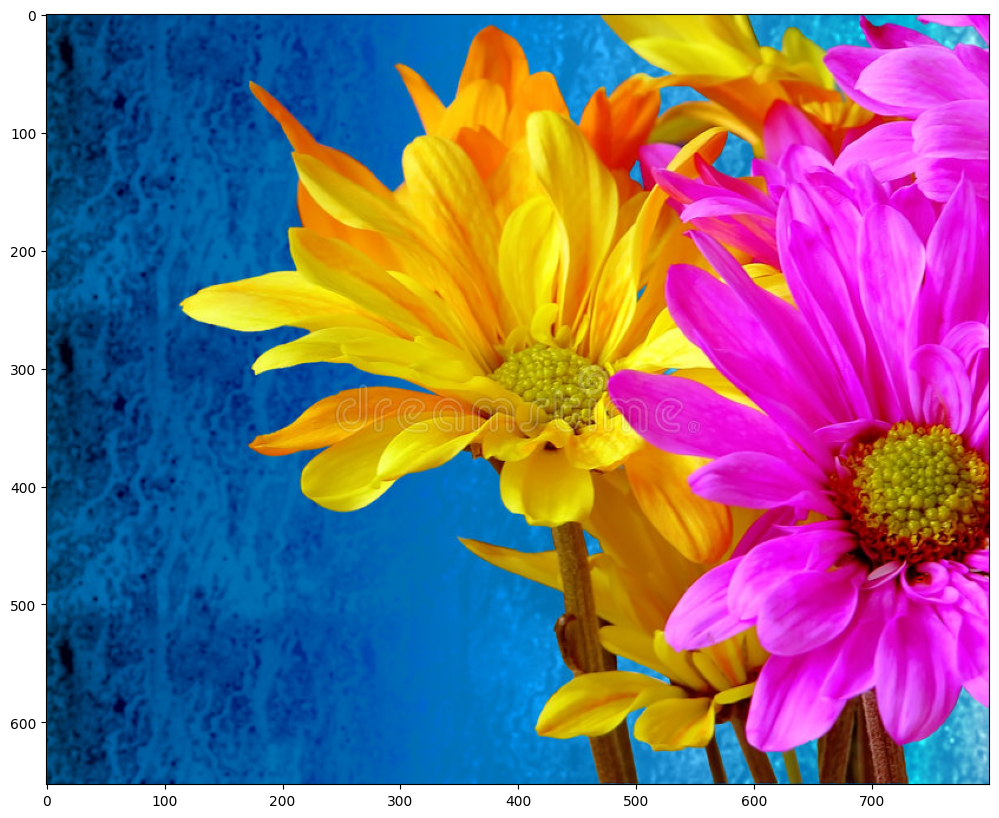

In [9]:
showImage(high_contrast_img)

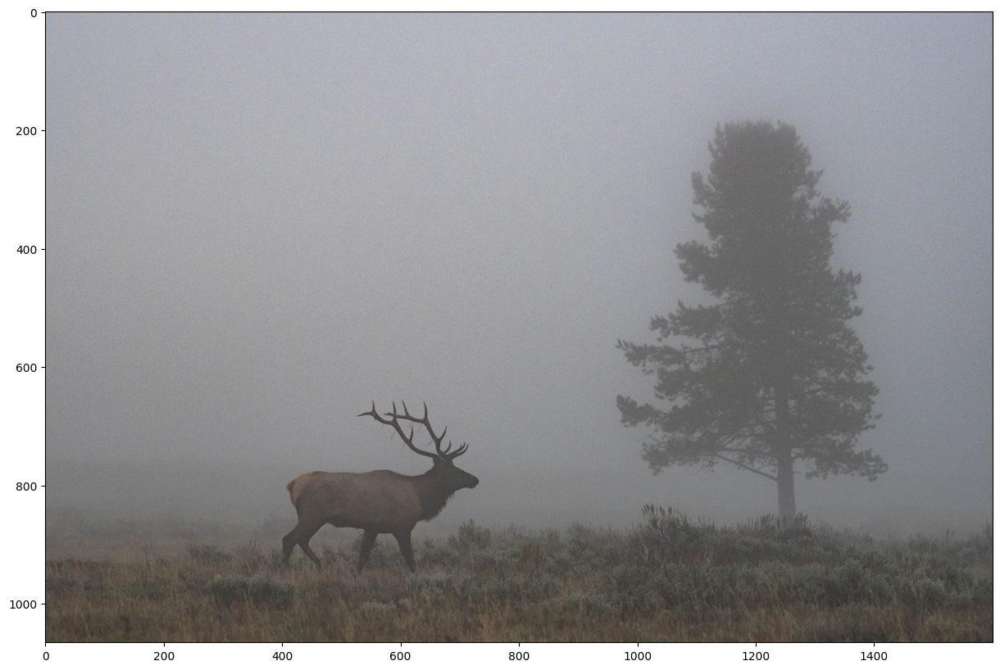

In [10]:
showImage(low_contrast_img)

In [11]:
test_high_contrast_img = high_contrast_img[400:600, 600:800]
test_low_contrast_img = low_contrast_img[400:800, 600:1000]

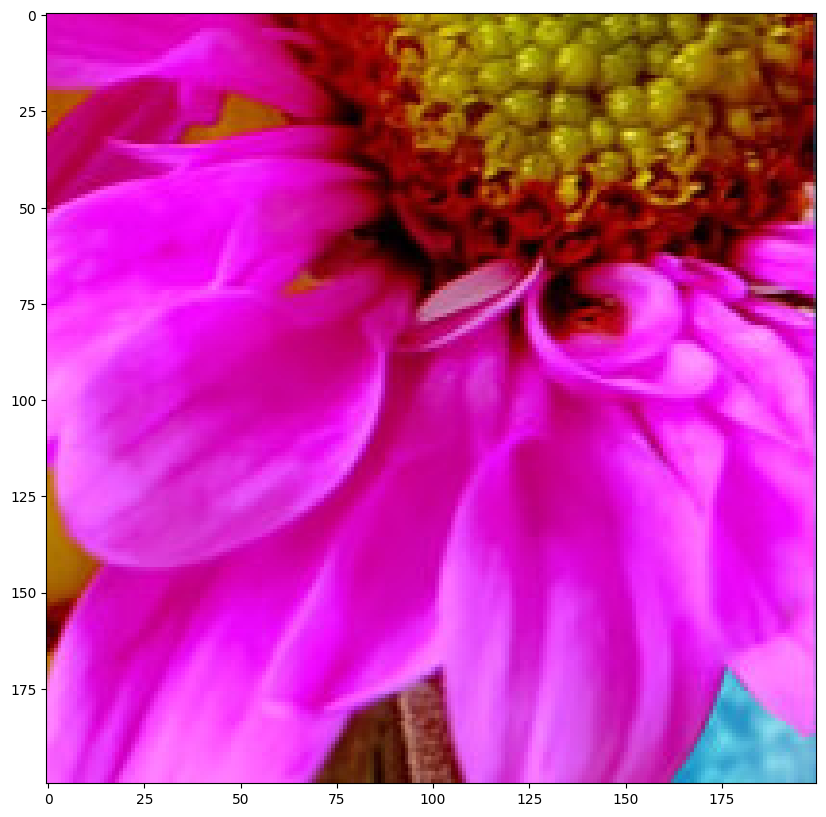

In [12]:
showImage(test_high_contrast_img)

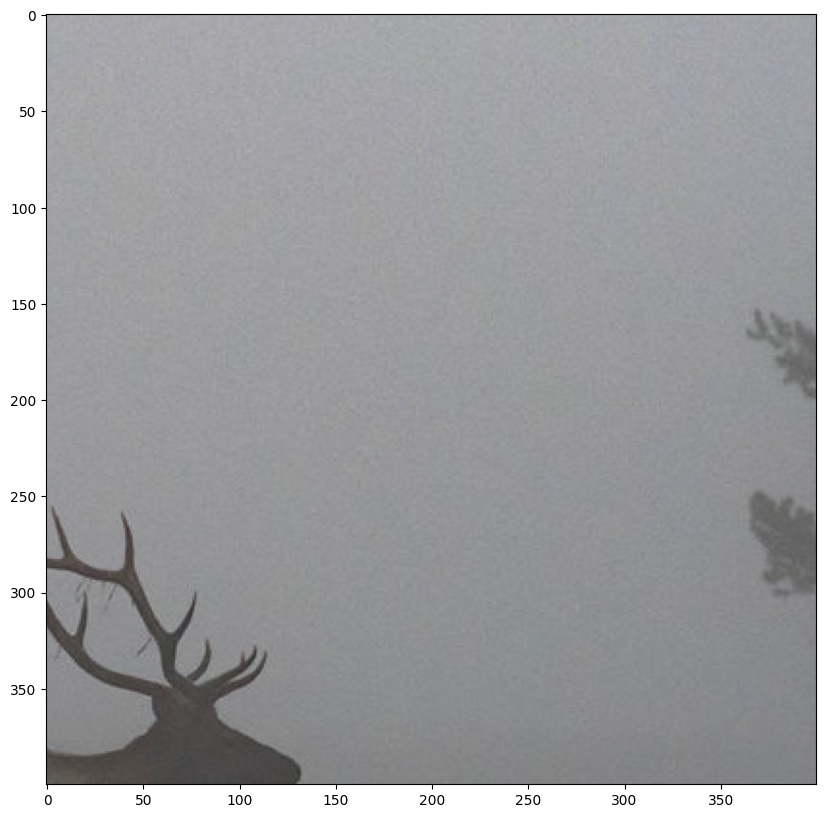

In [13]:
showImage(test_low_contrast_img)

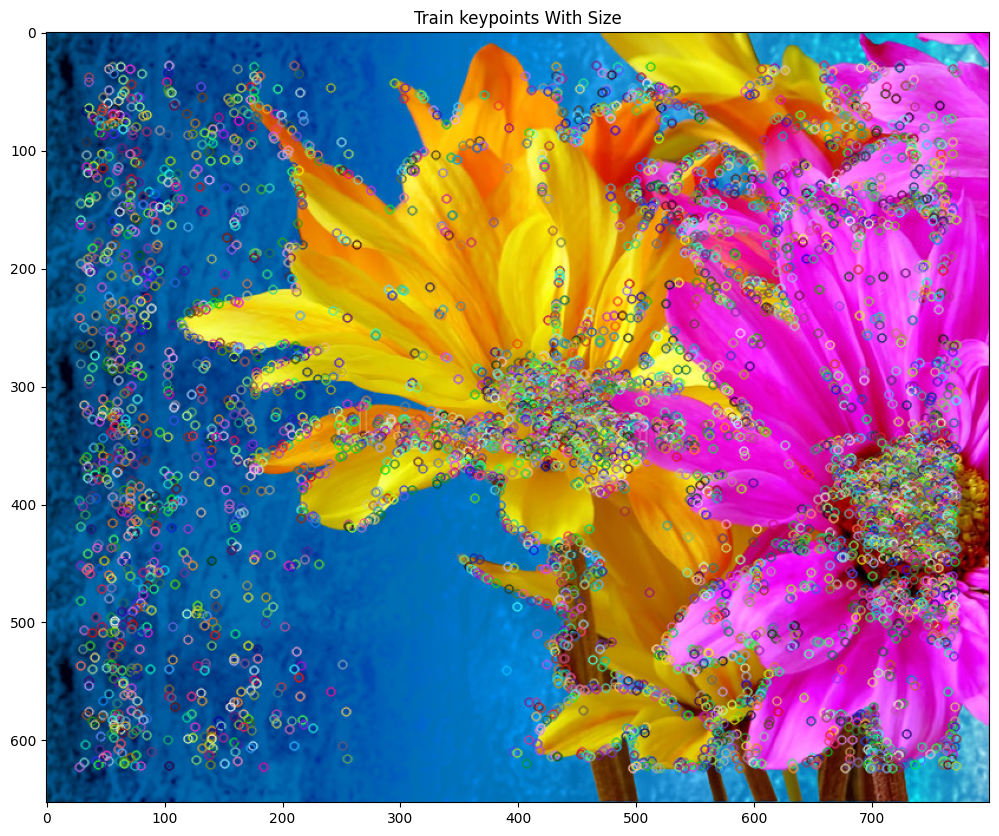

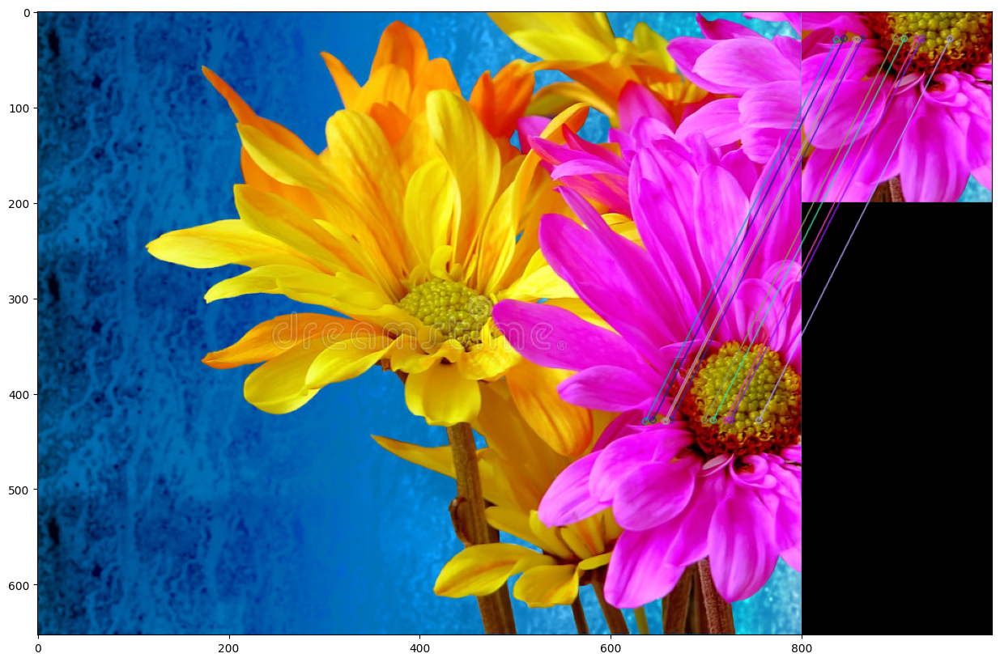

In [14]:
showImage(briefMatcher(high_contrast_img, test_high_contrast_img, 10))

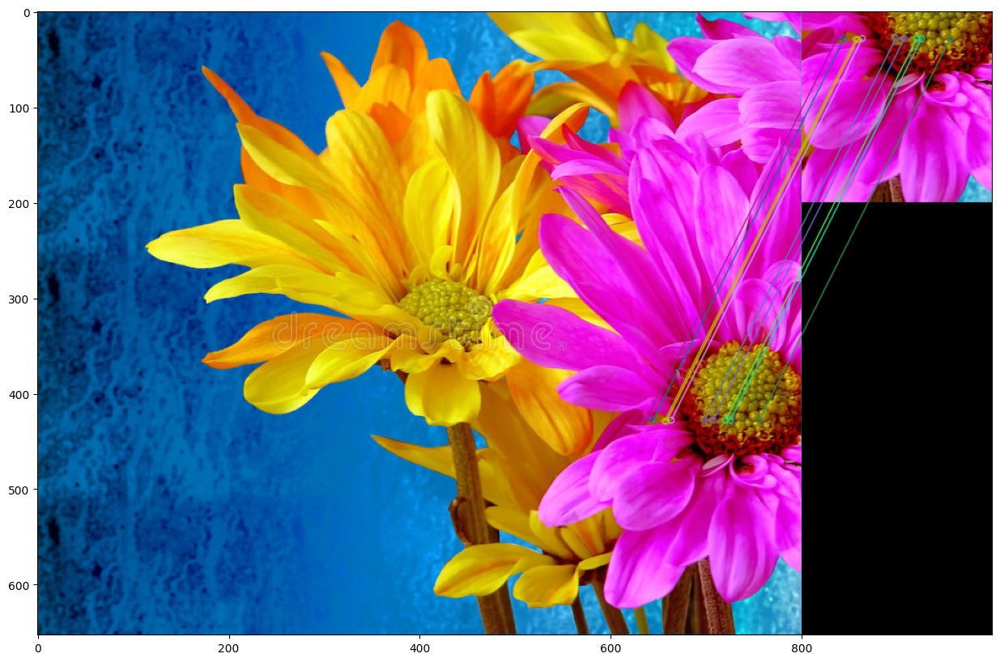

In [15]:
showImage(myBriefMatcher(high_contrast_img, test_high_contrast_img, 10))

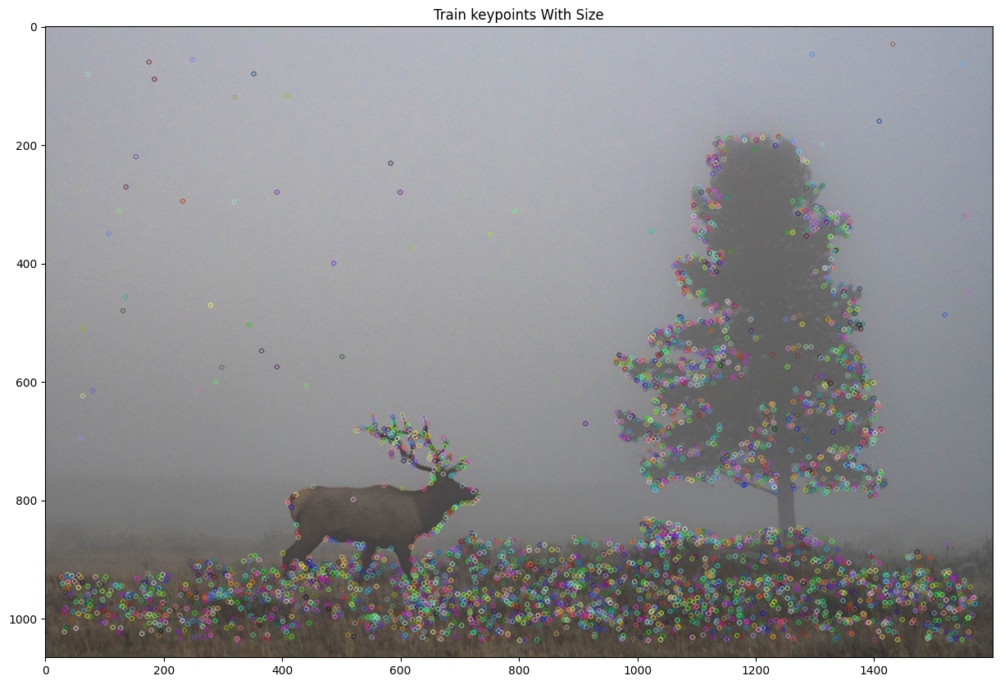

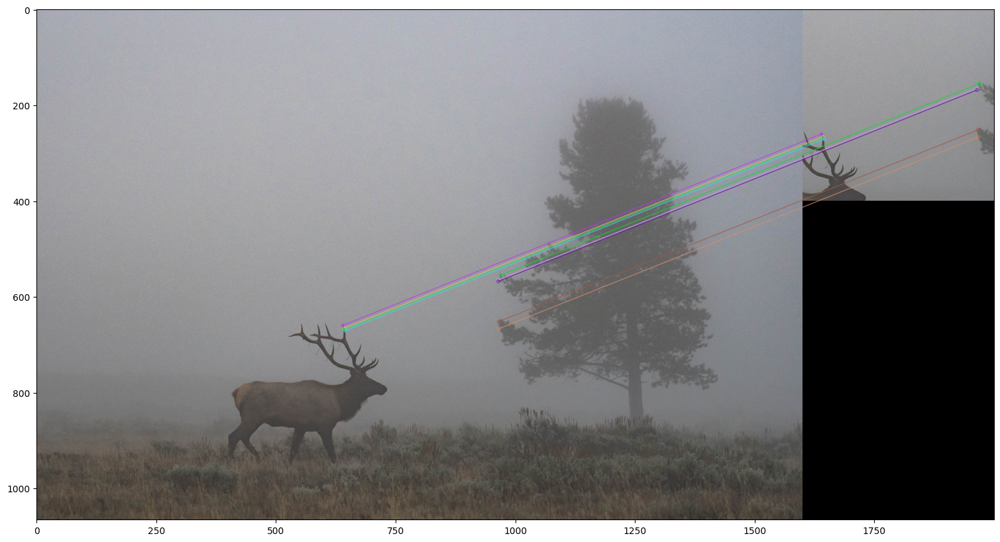

In [16]:
showImage(briefMatcher(low_contrast_img, test_low_contrast_img, 10))

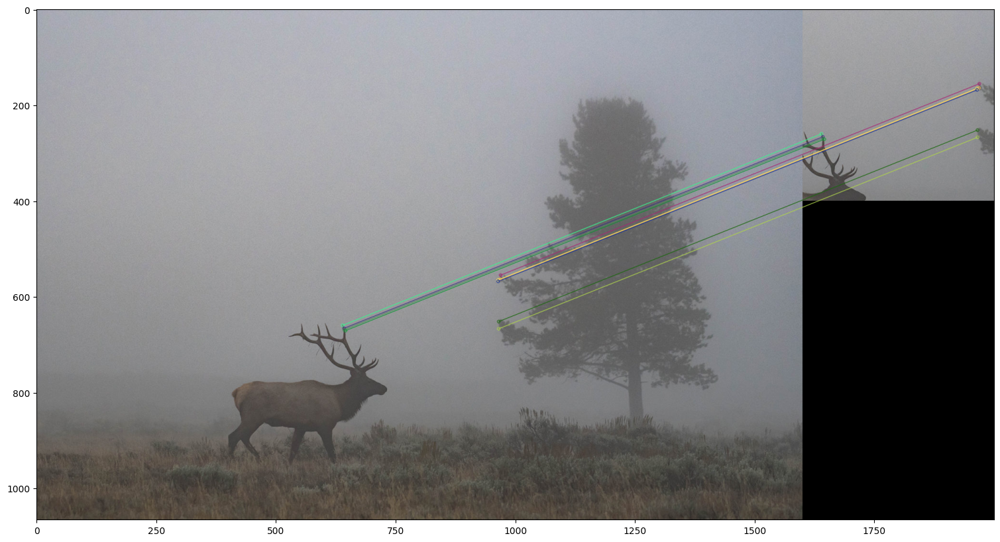

In [17]:
showImage(myBriefMatcher(low_contrast_img, test_low_contrast_img, 10))